# Libraries

In [1]:
# Python numeric data library
import numpy as np
# Plotting libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
# To calculate distances between points in a matrix
from scipy.spatial.distance import cdist
# To deal with dataframes
import pandas as pd

# Plotting parameters for matplotlib (in the jupyter notebook)
%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 7.0)

### To read the images:
#!xcode-select --install
#!pip install Pillow
import PIL.Image as pil

# Dealing with Images in Python using PIL
###### Author: Ramon Durães 
###### Date: May 2017



## Reading Images

Suppose you want to map the deforestation areas next to the Amazon National Park:

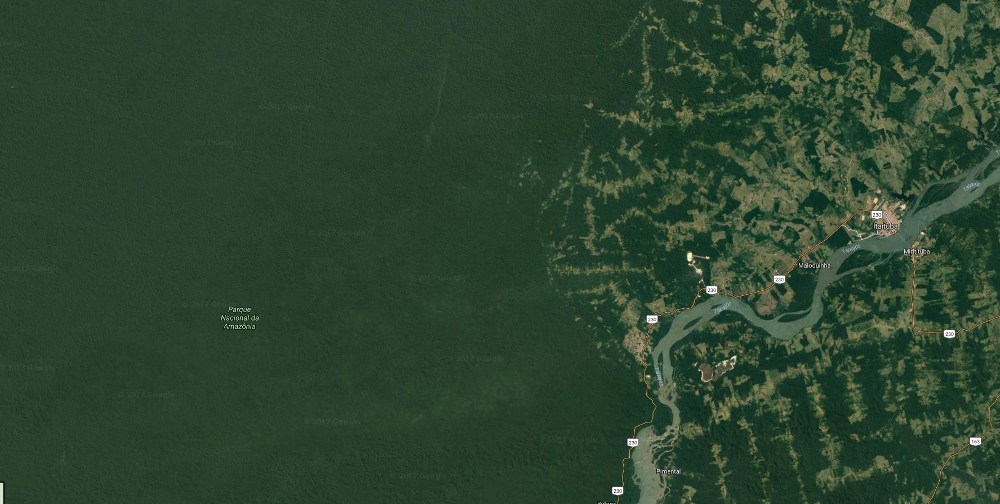

In [2]:
img1_labels = pil.open('map_labels.png') # pil.open() to read an image
img1_labels # To view the image. You can also use img1_labels.show()

You are given the following image (same as the above, without the labels from Google Maps):

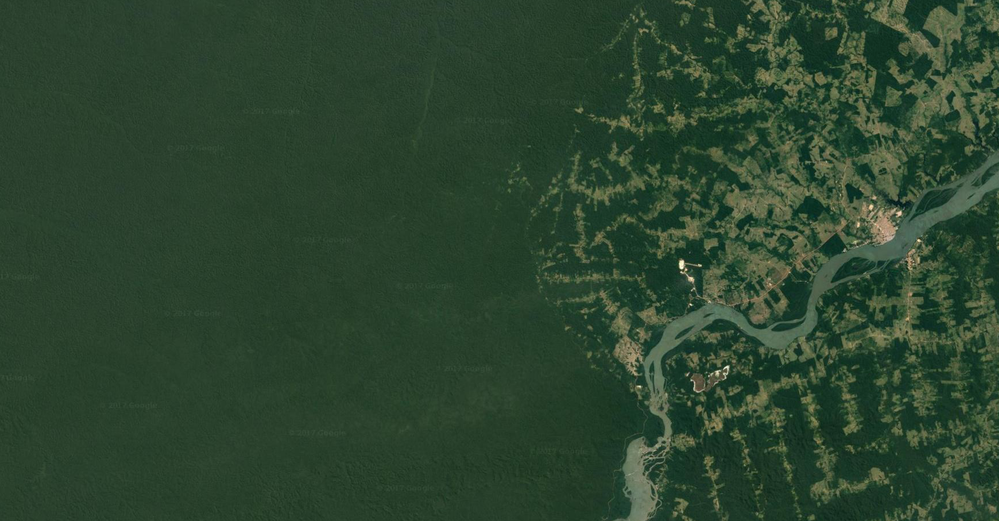

In [3]:
img1_raw = pil.open('map_nolabels.png')
img1_raw

## Changing the Data Type

Reading the image using pil.open() stores it in the data structure 'PIL.Image.Image':

In [4]:
img1_rgb = img1_raw.convert('RGB') # Converts the image to the RGB space
type(img1_rgb)

PIL.Image.Image

We want it in the 'numpy.ndarray' (Numpy library's N-Dimensional Array) form in order to work with it:

In [5]:
p1, p2 = img1_rgb.size # Gets the dimensions
img1_ndarray = np.array(img1_rgb) # Converts from PIL.Image.Image to numpy array
type(img1_ndarray)

numpy.ndarray

In [6]:
print 'Now our image is in the form of a numpy n-dimensional array with dimensions:', img1_ndarray.shape

Now our image is in the form of a numpy n-dimensional array with dimensions: (907, 1740, 3)


The third dimension of the array corresponds to each channel of the image:

- Red :   [:, :, 1]
- Green : [:, :, 2]
- Blue :  [:, :, 3]

## Converting to a 2-dimensional Array

In order to work with the colours of our image, we want to represent it in the RGB space, which means that we need to stack the individual pixel values. In other words, we want to keep the third dimension (that represents the red, green and blue values of the pixels) and stack the first two. Hence we end up with a matrix of dimensions $(d1*d2)$ by $d3$.

In [7]:
img1_stack = img1_ndarray.reshape(-1,3) # stacks pixels
print 'Now our image is in the form of a numpy array with dimensions:', img1_stack.shape

Now our image is in the form of a numpy array with dimensions: (1578180, 3)


Visualising the first 10 rows of the matrix:

In [8]:
print img1_stack[0:10,:]

[[44 66 47]
 [43 65 46]
 [41 63 44]
 [40 62 43]
 [41 63 44]
 [43 65 46]
 [43 65 46]
 [41 63 44]
 [39 61 42]
 [40 62 43]]


Sanity check: multiplying the first and second dimensions of the image to see if it matches the first dimension of our matrix of stacked pixels:

In [9]:
print p1*p2 

1578180


**AT THIS POINT YOU SHOULD USE YOUR MATRIX OF STACKED PIXELS TO PERFORM THE CLUSTERING.** In this case, I would use img1_stack as the matrix of points 'X' (the parameter for the clustering algorithm).

## Image as points in the RGB space

This is a simple plot of the pixel values in the RGB colour space. Do not worry about what this chunk of code does specifically. All we want is to see how a sample of the pixel values of the image is distributed in the RGB colour space. Notice that instead of plotting the 3-dimensional data, the following image shows the data in every combination of 2 dimensions: (Red by Green), (Red by Blue) and (Green by Blue), as well as a histogram of the 1-dimensional values.

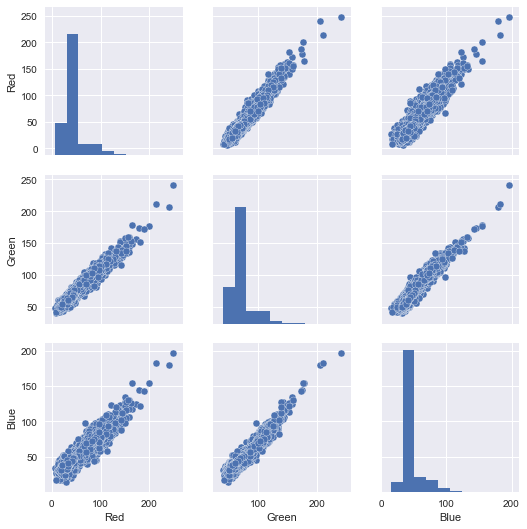

In [10]:
# Sampling some values
Idx = np.arange(img1_stack.shape[0]) # A sequence from 0 to the number of pixels
sampleIdx = np.random.choice(Idx, size = 10000) # Sampling some values to be visualised
img1_stack_sample = img1_stack[sampleIdx] # Selecting the sampled pixels
img1_df_sample = pd.DataFrame(img1_stack_sample, columns=['Red', 'Green', 'Blue']) # Converting the sample to a pandas dataframe

# Visualizing
sns.pairplot(img1_df_sample)

## Reconstructing the Image

Notice that by stacking the pixel values of the image we dismantle its initial spacial structure, which means that we need to recover it after we finish clustering the pixel values. We do that by reshaping the numpy array:

In [11]:
rebuilt_image = img1_stack.reshape(p2,p1,3) # Notice that we use p2,p1,3 instead of p1,p2,3.
rebuilt_image.shape

(907, 1740, 3)

Now we have the image back in its original shape, but still in the np.ndarray format. 

In [12]:
rebuilt_image

array([[[44, 66, 47],
        [43, 65, 46],
        [41, 63, 44],
        ..., 
        [60, 90, 61],
        [57, 86, 57],
        [47, 76, 47]],

       [[45, 67, 48],
        [46, 68, 49],
        [44, 66, 47],
        ..., 
        [61, 92, 64],
        [66, 97, 70],
        [60, 91, 64]],

       [[42, 64, 45],
        [43, 65, 46],
        [46, 68, 49],
        ..., 
        [64, 97, 70],
        [56, 89, 63],
        [41, 73, 48]],

       ..., 
       [[40, 62, 43],
        [40, 62, 43],
        [41, 63, 44],
        ..., 
        [34, 62, 32],
        [37, 66, 37],
        [49, 77, 50]],

       [[39, 61, 42],
        [38, 60, 41],
        [39, 61, 42],
        ..., 
        [40, 69, 38],
        [37, 66, 37],
        [40, 67, 42]],

       [[40, 62, 43],
        [41, 63, 44],
        [40, 62, 43],
        ..., 
        [43, 67, 41],
        [35, 62, 38],
        [37, 63, 42]]], dtype=uint8)

Notice that pixel values are integeres ranging from 0 to 255, which means they are unsigned intergers with 8 bits of precision: $2^8 = 256$ values. In order to visualise the image, we want it back in the PIL library's PIL.Image.Image format.

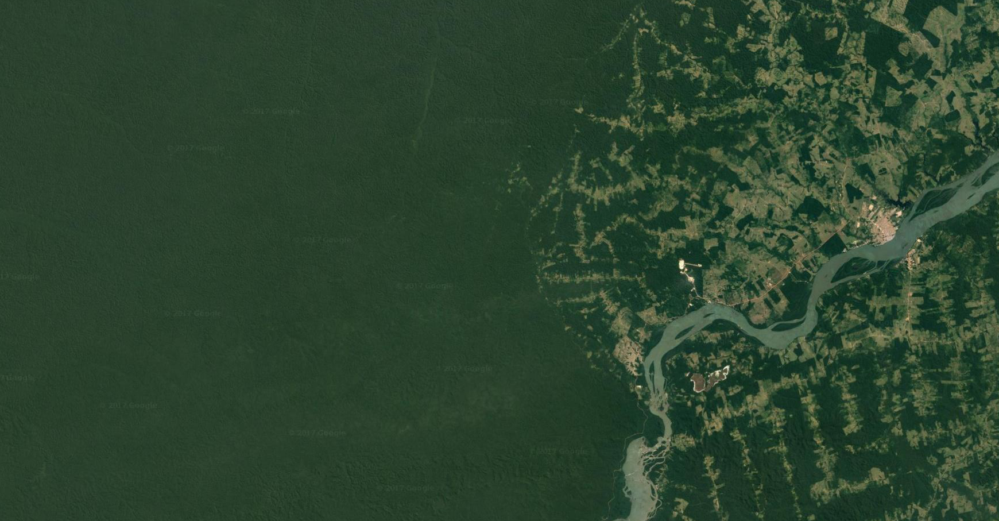

In [13]:
img1_rebuilt_pil = pil.fromarray(np.uint8(rebuilt_image), mode='RGB')
img1_rebuilt_pil

Voilà!

# Summary:

To apply all the steps shown above to multiple images, we want to convert all those chunks of code into a function that takes as input an image in the PIL.Image.Image format and returns a matrix of stacked pixels:

In [14]:
def stack_image(img_file):
    img_rgb = img_file.convert('RGB') # Converts the image to RGB
    p1, p2 = img_rgb.size # Gets the dimensions
    img_ndarray = np.array(img_rgb) # Converts from PIL.Image.Image to numpy.ndarray
    img_stack = img_ndarray.reshape(-1,3) # Stacks the pixels
    return img_stack, p1, p2

And now another function to reconstruct the matrix after you have assigned each pixel value to its respective cluster value. The input is the matrix of stacked pixels and the previous dimensions of the image, the output is the image in the PIL.Image.Image format:

In [15]:
def reconstruct_image(stacked_pixels, p1, p2):
    reconstructed_array = stacked_pixels.reshape(p2,p1,3) # Notice we use p2,p1,3 instead of p1,p2,3
    reconstructed_image = pil.fromarray(np.uint8(rebuilt_image), mode='RGB') 
    # Notice we need to make sure the numpy array values are integers with 8 bits of precision! 
    return reconstructed_image

### Testing the code

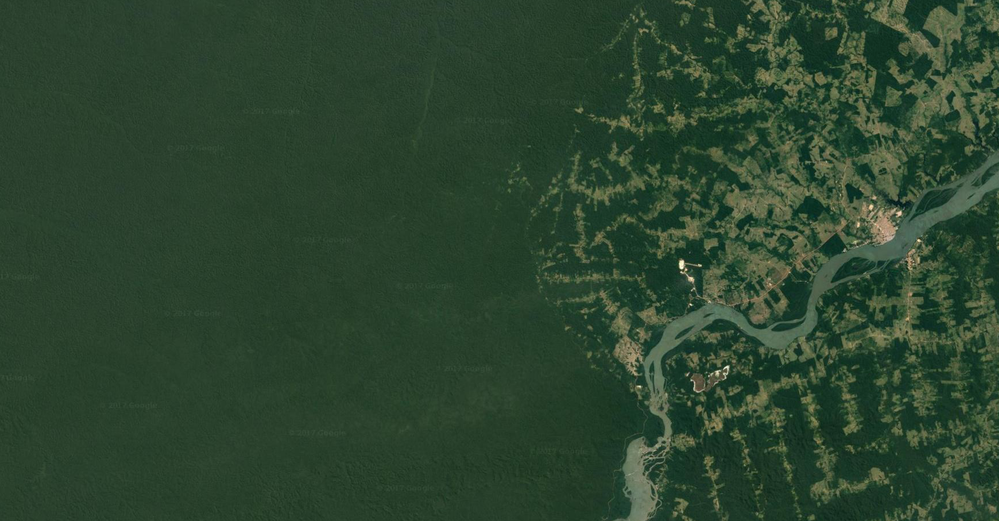

In [16]:
img1 = pil.open('map_nolabels.png') # pil.open() to read an image
img1

In [17]:
stacked_pixels, p1, p2 = stack_image(img1)
print stacked_pixels, p1, p2

[[44 66 47]
 [43 65 46]
 [41 63 44]
 ..., 
 [43 67 41]
 [35 62 38]
 [37 63 42]] 1740 907


In [18]:
type(stacked_pixels)

numpy.ndarray

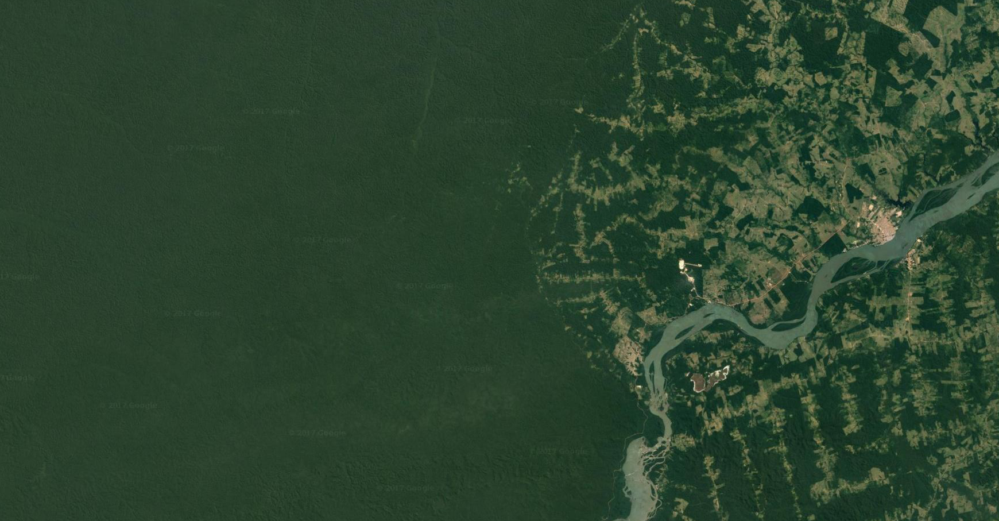

In [19]:
reconstructed_image = reconstruct_image(stacked_pixels, p1, p2)
reconstructed_image

In [20]:
type(reconstructed_image)

PIL.Image.Image